In [1]:
import os
import sys
EXLIB_DIR = "../src"
ABDX_DIR = "../data/abdomen"
cwd = os.getcwd()
print(cwd)

sys.path.append(EXLIB_DIR)
DATA_DIR = ABDX_DIR

from exlib.datasets.abdomen_organs import AbdomenOrgans, OrganGNGSopSelectorModel

from exlib.modules.sop import SOPImageSeg, SOPConfig, get_chained_attr
import torch
import torch.nn.functional as F

from torch.utils.data import DataLoader
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from collections import namedtuple

/shared_data0/weiqiuy/exlib/notebooks


In [2]:
import torch
state_dict = torch.load('../saved_models/sopsel_pto_ptgng_fzo_lr_0.01hello_best.pt')

In [3]:
model = OrganGNGSopSelectorModel()
test_dataset = AbdomenOrgans(DATA_DIR, split="test", image_height=352)

model.load_state_dict(state_dict['model_state_dict'])
model.eval();

In [4]:
def hatch_dim_and_outline(image, mask, c=0.6): 
    # print(image.shape, mask.shape)
    black = torch.zeros(image.shape)
    dimmed_image = (c*image + (1-c)*black)
    # mask = torch.zeros(image.shape[:2]+(1,))
    # mask[200:300,200:300] = 1
    masked_image = (mask*image + (1-mask)*dimmed_image)
    return masked_image

def plot_hatch(image, mask, ax, c=0.6):
    masked_image = hatch_dim_and_outline(image, mask.unsqueeze(-1), c=c)
    ax.imshow(masked_image.cpu().numpy())
    ax.contour(mask.cpu().numpy(), 2, colors='black', linestyles='dashed')
    ax.contourf(mask.cpu().numpy(), 2, hatches=['///', None, None],
                    cmap='gray', extend='neither', linestyles='--', alpha=0.01)

In [5]:
inputs_test = test_dataset[0]
image_test, organ_label_test, gonogo_label_test = inputs_test
image_test.shape, organ_label_test.shape, gonogo_label_test.shape
import time
start = time.time()
outputs = model(image_test.unsqueeze(0), return_dict=True)
print(time.time() - start)

0.7063286304473877


In [6]:
def show_mask_weights(i):
    ORGANS = ['other organs', 'liver', 'gallbladder', 'hepatocystic triangle']
    GONOGO = ['unknown', 'safe', 'unsafe']
    inputs_test = test_dataset[i]
    image_test, organ_label_test, gonogo_label_test = inputs_test
    print(image_test.shape, organ_label_test.shape, gonogo_label_test.shape)
    with torch.no_grad():
        outputs = model(image_test.unsqueeze(0), return_dict=True)
    organ_output = outputs['organ_output']
    gonogo_output = outputs['gonogo_output']
    organ_mask_output = organ_output.logits.argmax(dim=1).byte()
    organ_mask_output.shape
    gonogo_mask_output = gonogo_output.logits.argmax(dim=1).byte()
    gonogo_mask_output.shape
    
    
    # show original image
    plt.imshow(image_test.permute(1,2,0).cpu().numpy())
    plt.title('Original Image')
    plt.axis('off')
    
    fig, axes = plt.subplots(1, 4, figsize=(20, 4))  # 1 row, 5 columns
    

    # show gold organ label
    axes[0].imshow(organ_label_test.permute(1,2,0).cpu().numpy())
    axes[0].set_title('Organ Gold')
    axes[0].axis('off')

    # show organ pred
    axes[1].imshow(organ_mask_output.permute(1,2,0).cpu().numpy())
    axes[1].set_title('Organ Pred')
    axes[1].axis('off')
    
     # show gold gonogo label
    axes[2].imshow(gonogo_label_test.permute(1,2,0).cpu().numpy())
    axes[2].set_title('GoNoGo Gold')
    axes[2].axis('off')

    # show gonogo pred
    axes[3].imshow(gonogo_mask_output.permute(1,2,0).cpu().numpy())
    axes[3].set_title('GoNoGo Pred')
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()


    print('Go-nogo masks')

    num_masks = len(gonogo_output.mask_weights[0])
    fig, axes = plt.subplots(1, num_masks, figsize=(5*num_masks, 4))  # Adjust figsize accordingly

    for i in range(num_masks):
        axes[i].imshow(gonogo_output.masks[0][i].cpu().numpy())
        mask_weight = gonogo_output.mask_weights[0][i].detach().cpu().numpy().tolist()
        axes[i].set_title(f'Mask {i}, Weight/Score {mask_weight}')
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()
    
    print('Go-nogo masks hatched')

    num_masks = len(gonogo_output.mask_weights[0])
    fig, axes = plt.subplots(1, num_masks, figsize=(5*num_masks, 4))  # Adjust figsize accordingly

    for i in range(num_masks):
        mask = gonogo_output.masks[0][i]
        plot_hatch(image_test.permute(1,2,0), mask, axes[i], c=0.5)
        mask_weight = gonogo_output.mask_weights[0][i].detach().cpu().numpy().tolist()
        mask_weight_show = "\n".join([f'{GONOGO[j]} {mask_weight[j]}' for j in range(len(mask_weight))])
        axes[i].set_title(f'{ORGANS[i]}, Mask {i}\nWeight/Score\n{mask_weight_show}')
        axes[i].axis('off')
    
    print('Gold organs masks hatched')

    num_masks = len(gonogo_output.mask_weights[0])
    fig, axes = plt.subplots(1, num_masks, figsize=(5*num_masks, 4))  # Adjust figsize accordingly

    # print('organ_label_test', organ_label_test.shape)
    # print(organ_label_test[0])
    # print(organ_label_test[0].max())
    for i in range(num_masks):
        mask = (organ_label_test[0] == i).int()
        plot_hatch(image_test.permute(1,2,0), mask, axes[i], c=0.5)
        axes[i].set_title(f'Organ {i} {ORGANS[i]}')
        axes[i].axis('off')
        
    print('Gold gonogo masks hatched')

    num_masks = 3
    fig, axes = plt.subplots(1, num_masks, figsize=(5*num_masks, 4))  # Adjust figsize accordingly

    for i in range(num_masks):
        mask = (gonogo_label_test[0] == i).int()
        plot_hatch(image_test.permute(1,2,0), mask, axes[i], c=0.5)
        axes[i].set_title(f'Gonogo {i} {GONOGO[i]}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()
    
    print('Pred gonogo masks hatched')

    num_masks = 3
    fig, axes = plt.subplots(1, num_masks, figsize=(5*num_masks, 4))  # Adjust figsize accordingly

    for i in range(num_masks):
        mask = (gonogo_mask_output[0] == i).int()
        plot_hatch(image_test.permute(1,2,0), mask, axes[i], c=0.5)
        axes[i].set_title(f'Gonogo {i} {GONOGO[i]}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()
        
    print('organ x gonogo hatched')
    
    num_og = 4
    num_gng = 3
    fig, axes = plt.subplots(num_gng, num_og, figsize=(5*num_gng, 2*num_og))  # Adjust figsize accordingly
    
    for i_og in range(num_og):
        for i_gng in range(num_gng):
            mask = gonogo_output.logits_all[0,i_og,i_gng]
            plot_hatch(image_test.permute(1,2,0), mask, axes[i_gng][i_og], c=0.5)
            axes[i_gng][i_og].set_title(f'Organ {ORGANS[i_og]}\nGonogo {GONOGO[i_gng]}')
            axes[i_gng][i_og].axis('off')
        
    plt.tight_layout()
    plt.show()
    
    print('weighted organ masks')
    for i in range(4):
        for j in range(3):
            fig, axes = plt.subplots(1, 3, figsize=(5*3, 4))
            im0 = axes[0].imshow(gonogo_output.logits_all[0][i][j], vmin=0, vmax=1)
            axes[0].set_title(f'organ {i} {ORGANS[i]}, gonogo {j} {GONOGO[j]}\nPred')
            im1 = axes[1].imshow((gonogo_output.logits_all * gonogo_output.mask_weights.unsqueeze(-1).unsqueeze(-1))[0][i][j], vmin=0, vmax=1)
            axes[1].set_title(f'organ {i} {ORGANS[i]}, gonogo {j} {GONOGO[j]}\nWeighted Pred')
            im2 = axes[2].imshow((gonogo_output.masks.unsqueeze(2) * gonogo_output.mask_weights.unsqueeze(-1).unsqueeze(-1))[0][i][j], vmin=0, vmax=1)
            axes[2].set_title(f'organ {i} {ORGANS[i]}, gonogo {j} {GONOGO[j]}\nWeighted Input Organ')
            fig.colorbar(im0, ax=axes[0])
            fig.colorbar(im1, ax=axes[1])
            fig.colorbar(im2, ax=axes[2])
            plt.show()

torch.Size([3, 352, 640]) torch.Size([1, 352, 640]) torch.Size([1, 352, 640])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


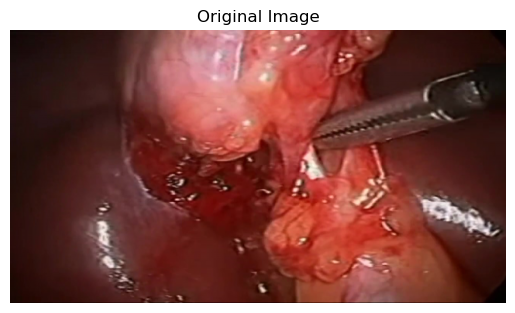

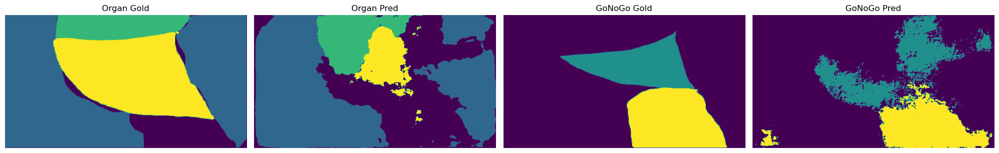

Go-nogo masks


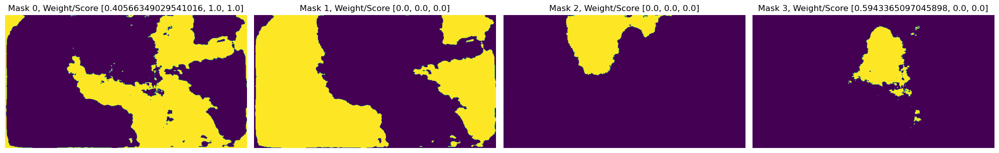

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Go-nogo masks hatched
Gold organs masks hatched


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Gold gonogo masks hatched


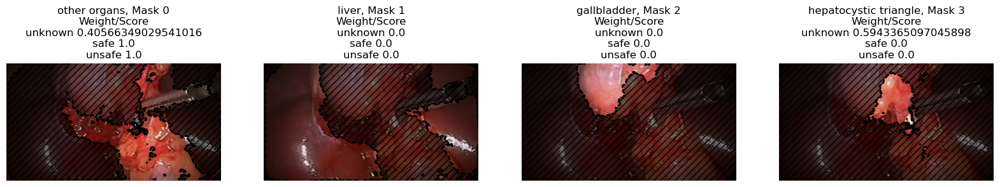

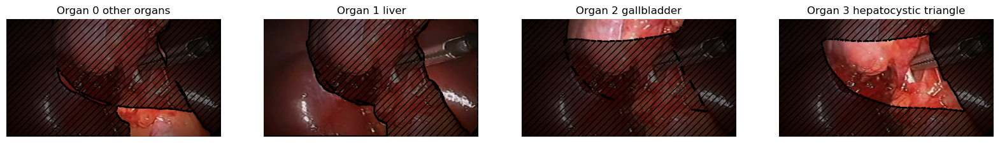

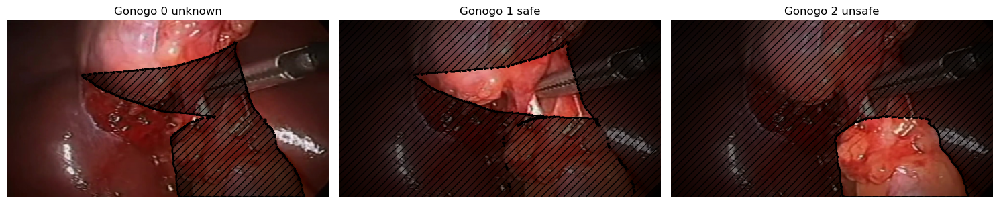

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Pred gonogo masks hatched


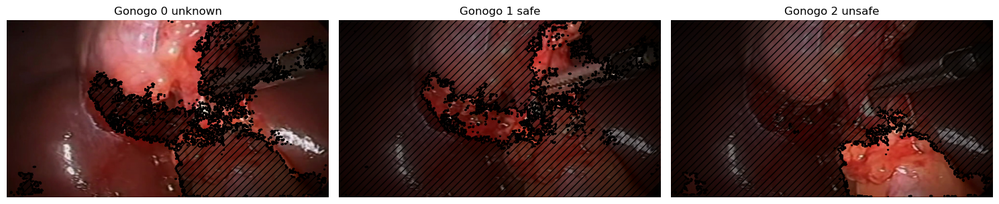

organ x gonogo hatched


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


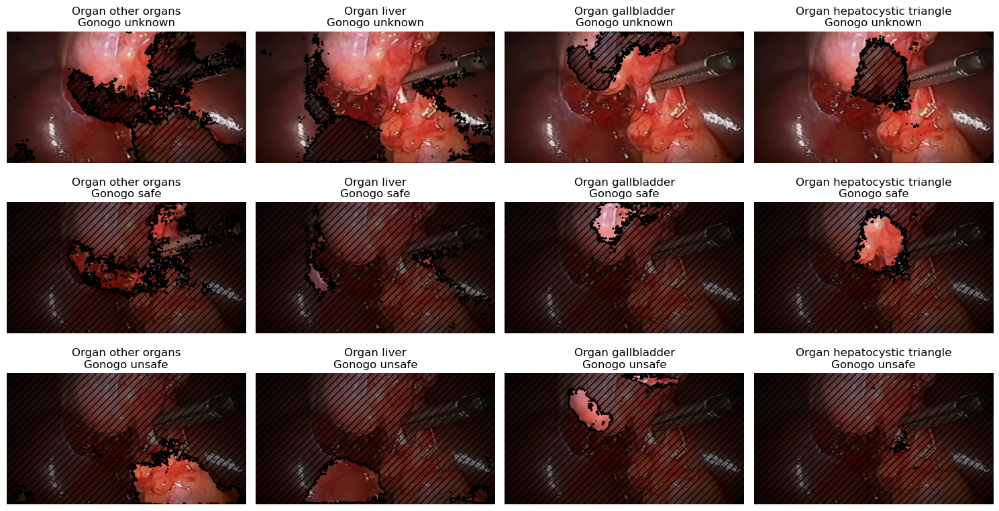

weighted organ masks


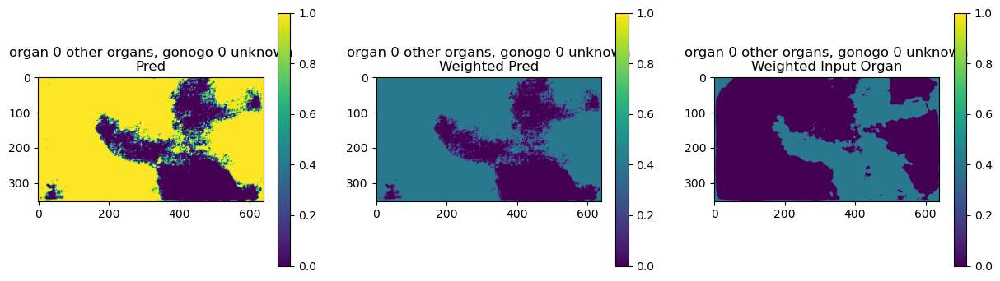

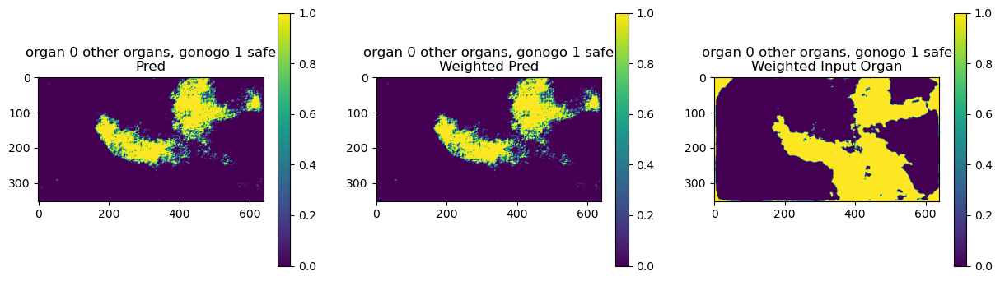

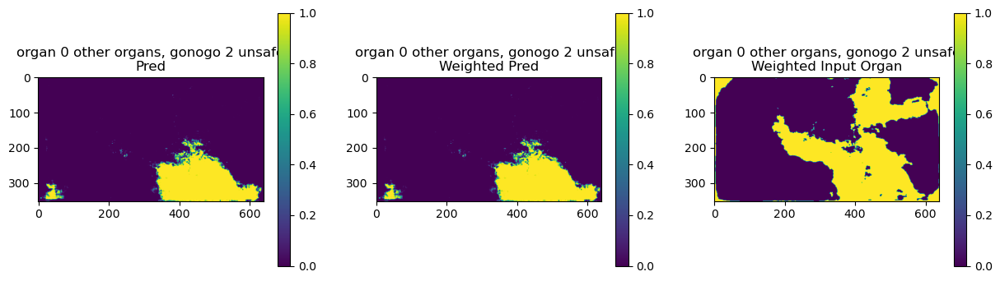

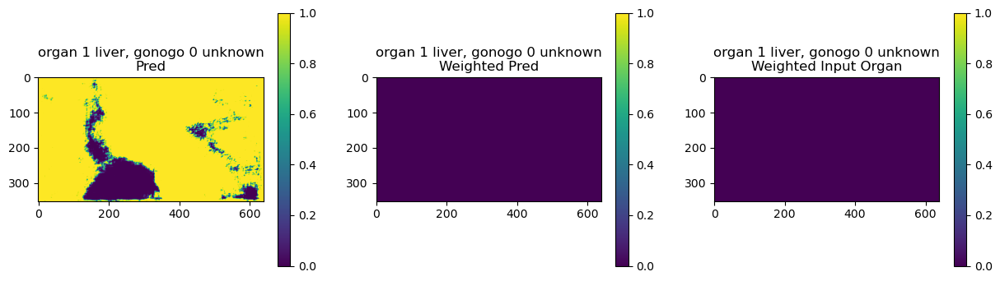

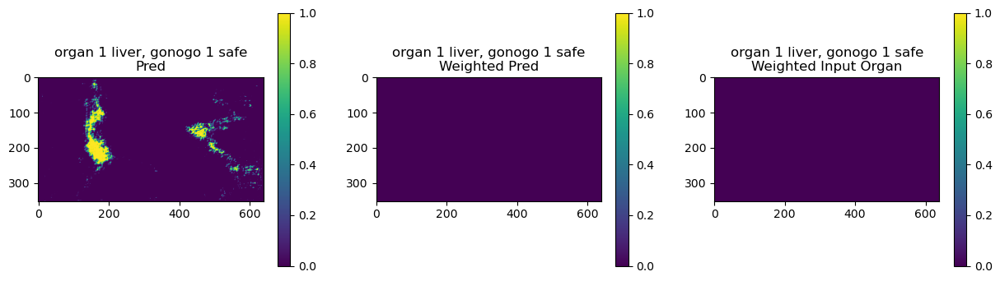

...

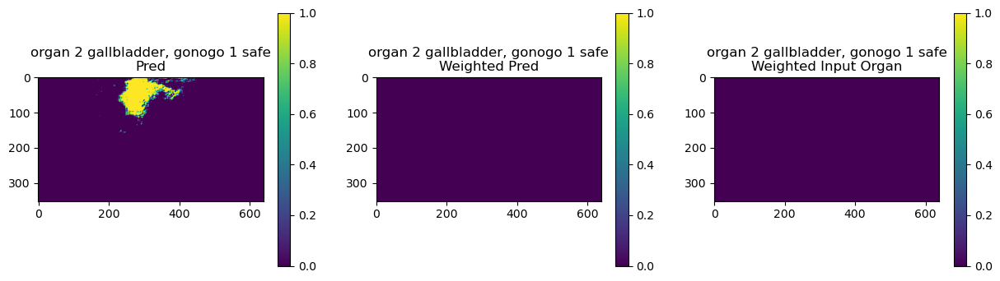

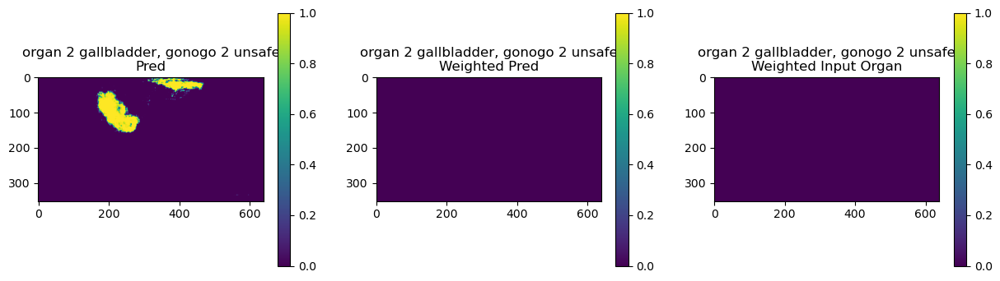

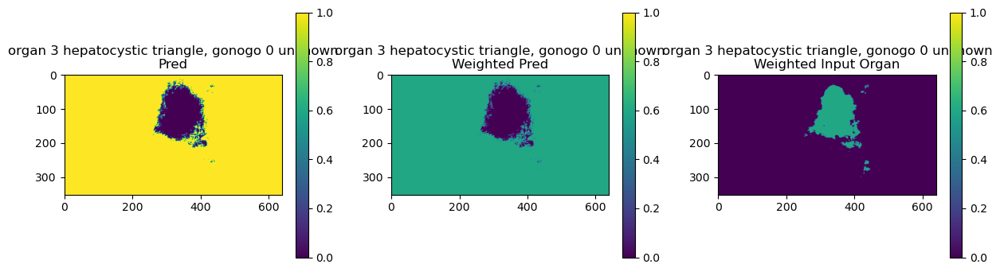

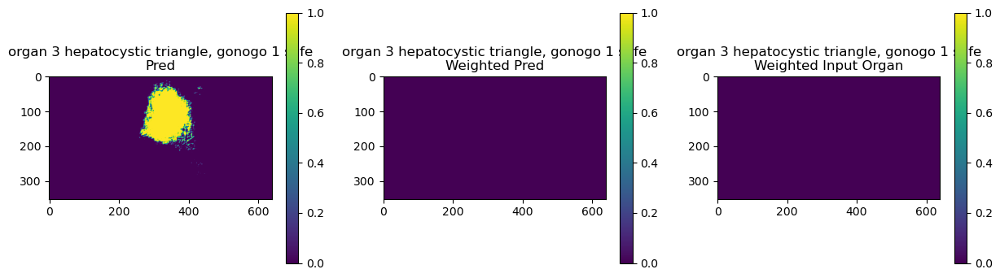

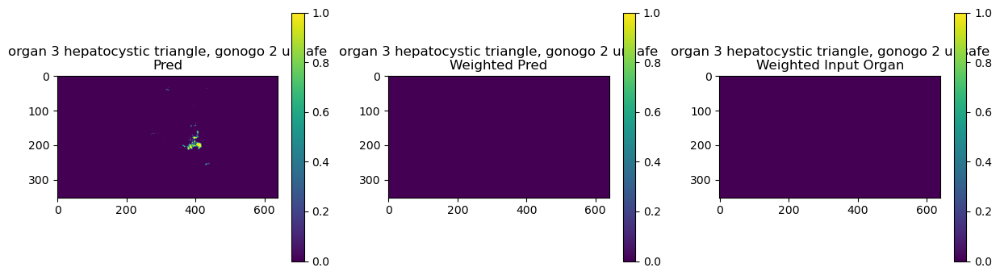

In [7]:
show_mask_weights(1)

torch.Size([3, 352, 640]) torch.Size([1, 352, 640]) torch.Size([1, 352, 640])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


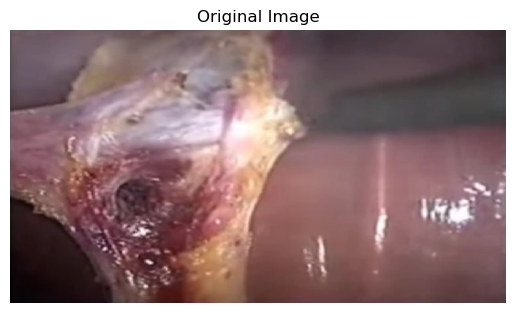

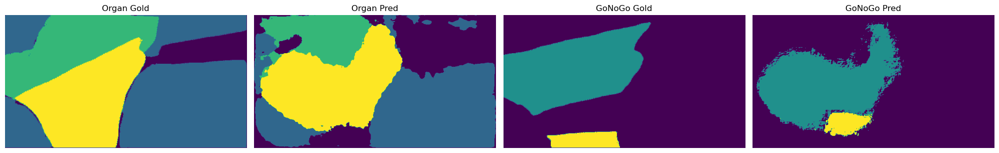

Go-nogo masks


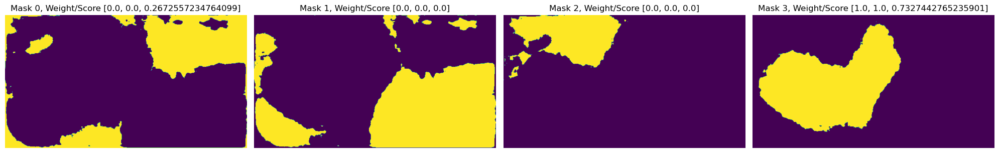

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Go-nogo masks hatched
Gold organs masks hatched


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Gold gonogo masks hatched


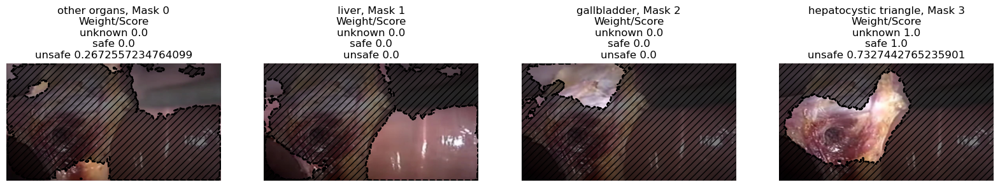

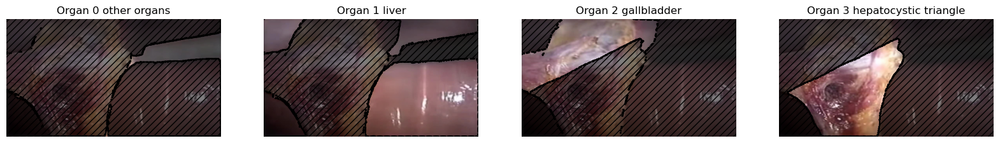

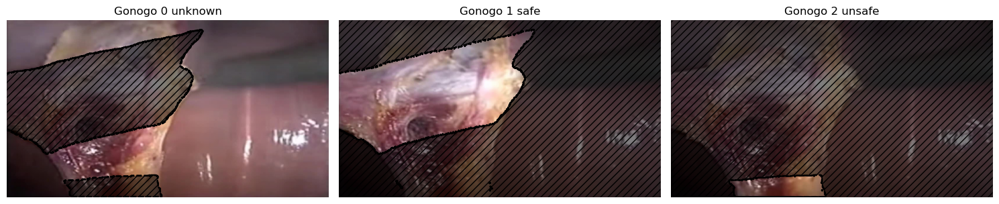

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Pred gonogo masks hatched


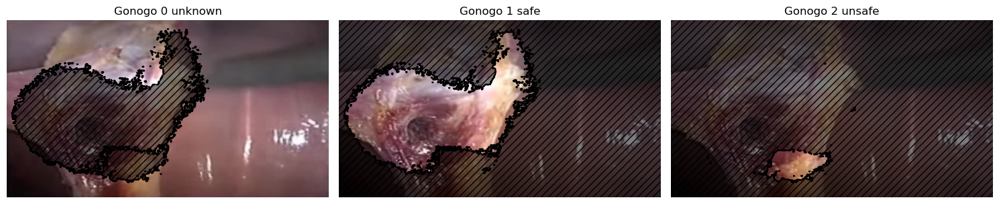

organ x gonogo hatched


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


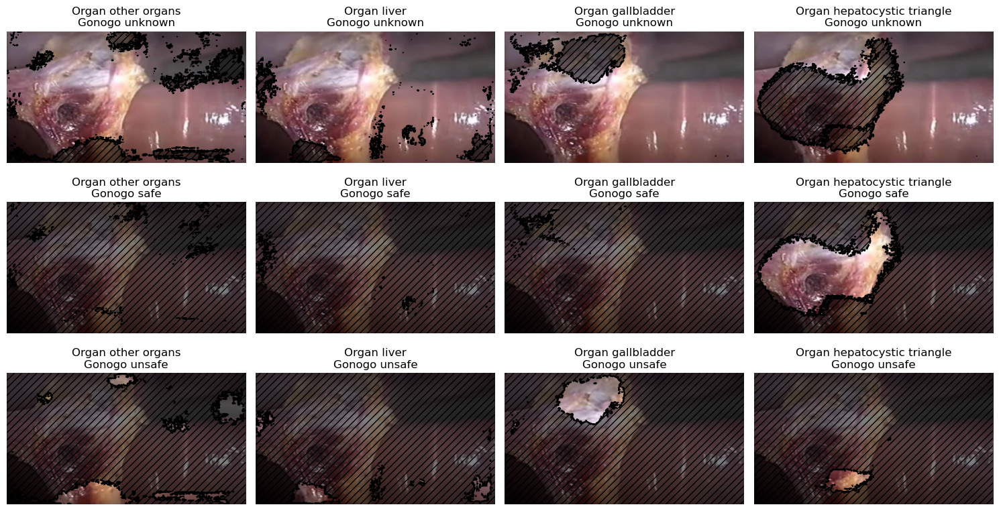

weighted organ masks


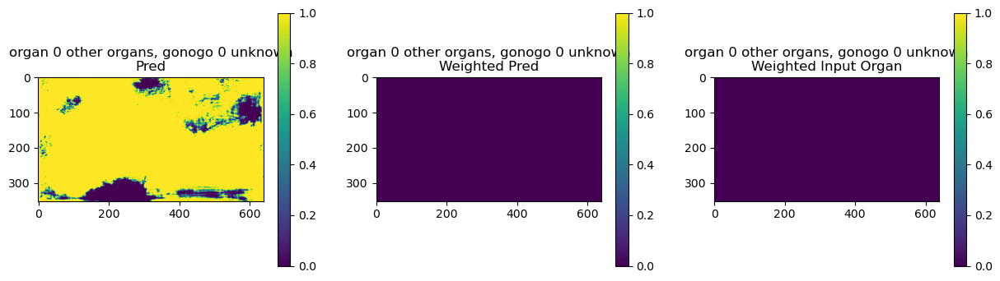

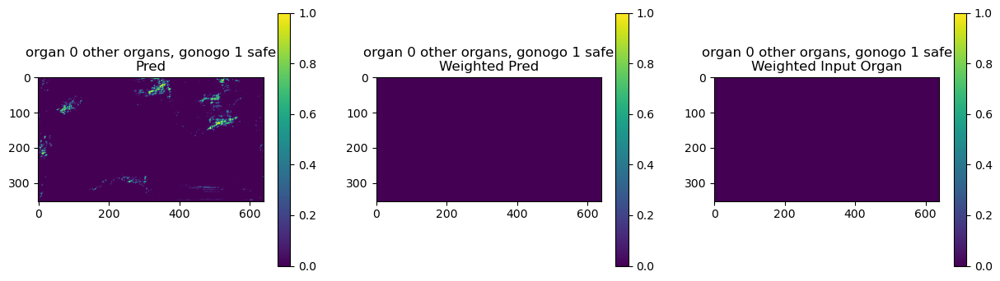

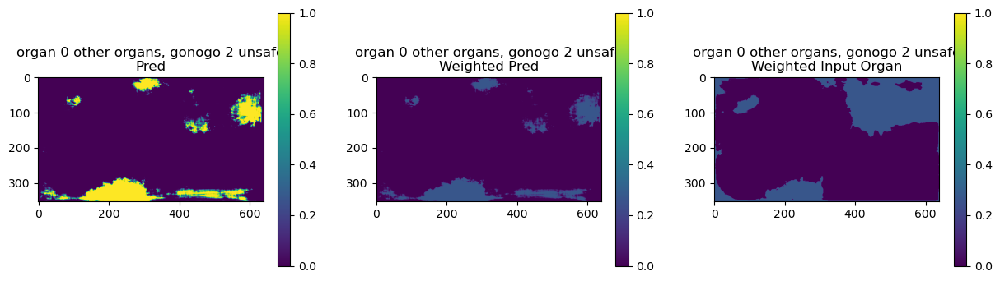

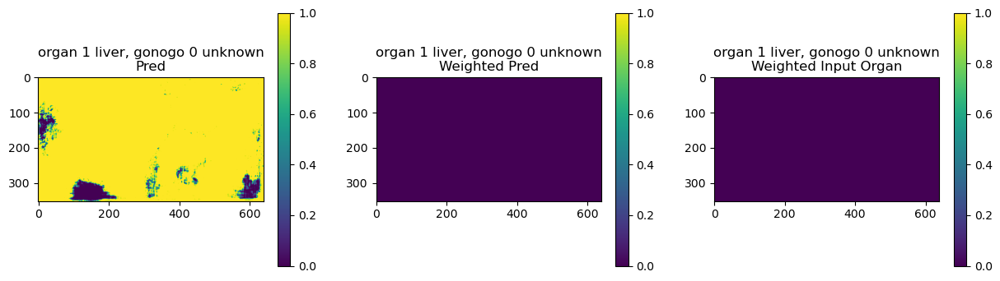

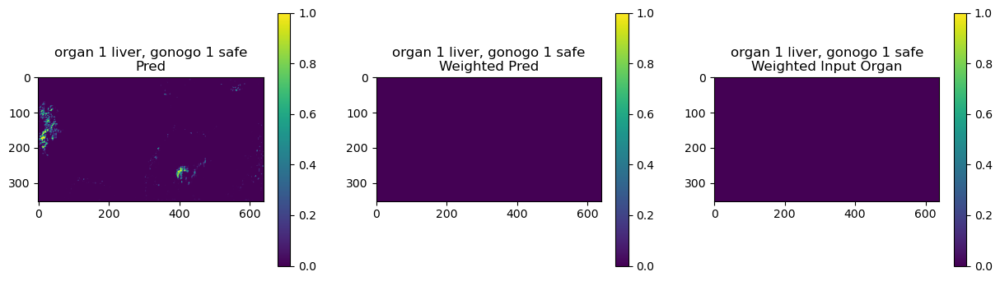

...

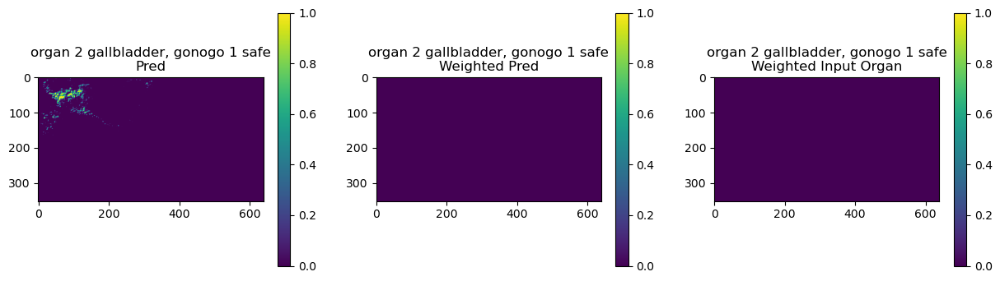

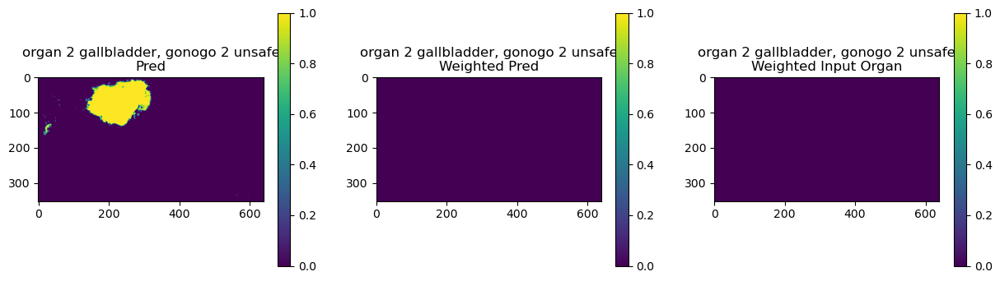

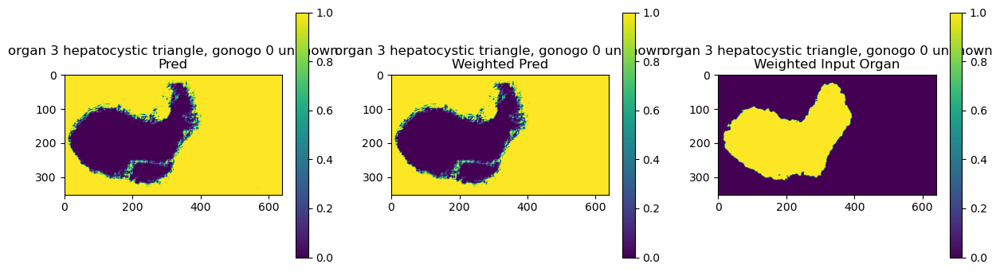

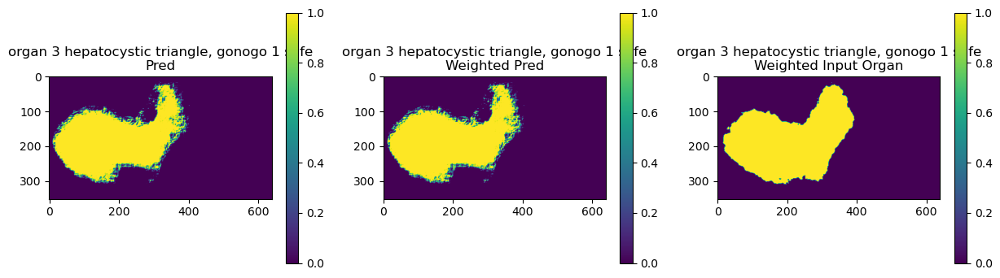

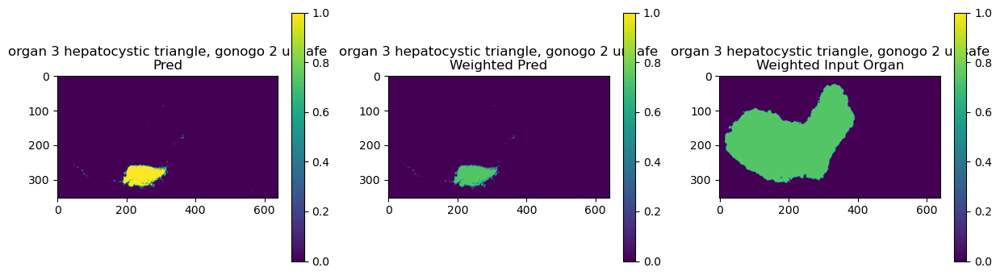

In [8]:
show_mask_weights(100)

torch.Size([3, 352, 640]) torch.Size([1, 352, 640]) torch.Size([1, 352, 640])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


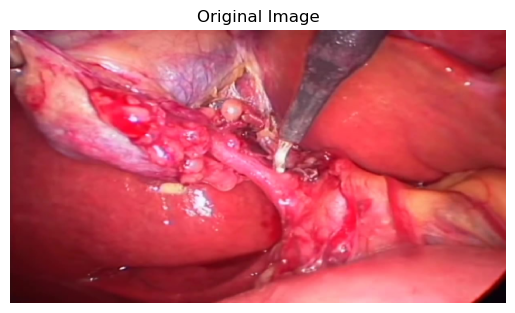

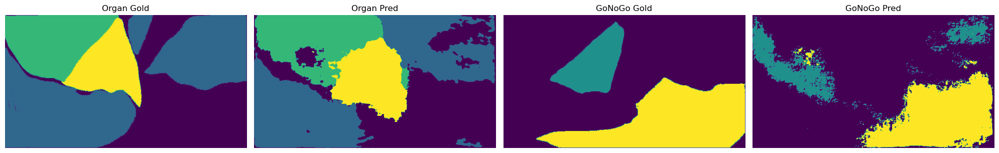

Go-nogo masks


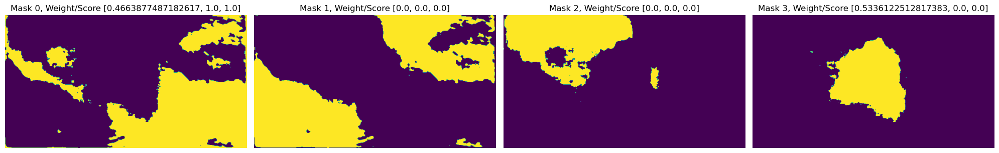

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Go-nogo masks hatched
Gold organs masks hatched


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Gold gonogo masks hatched


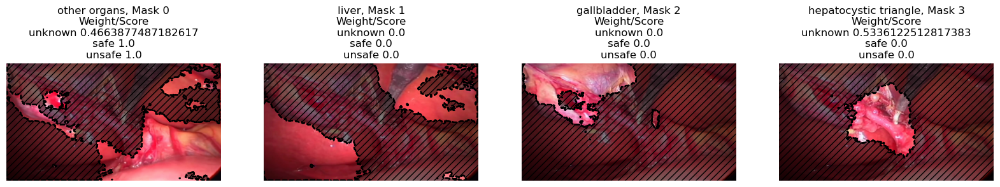

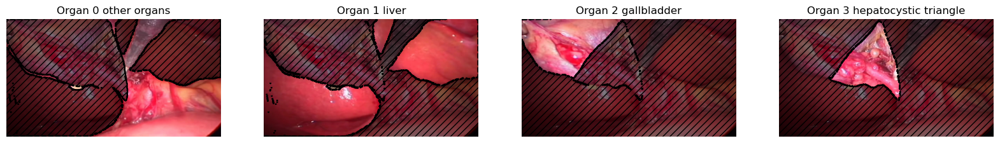

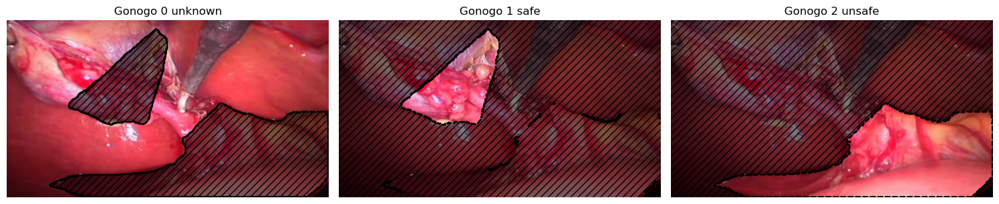

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Pred gonogo masks hatched


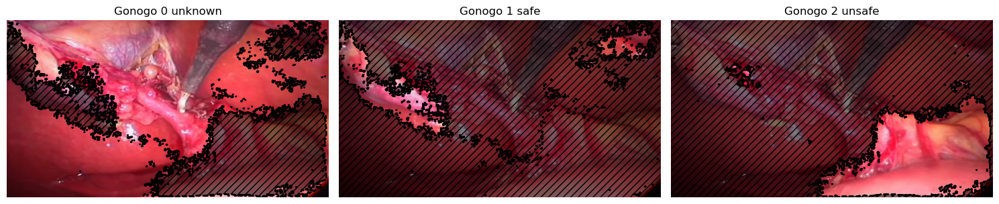

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


organ x gonogo hatched


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


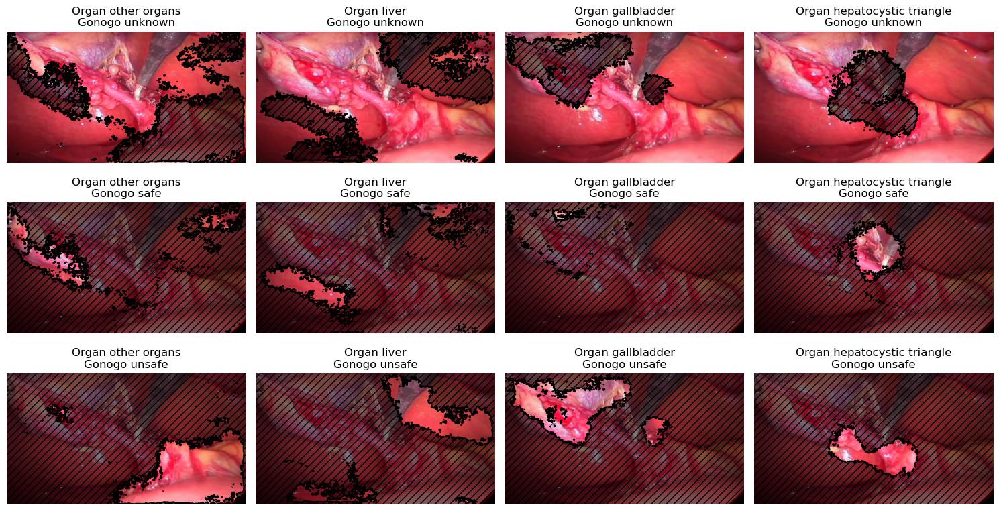

weighted organ masks


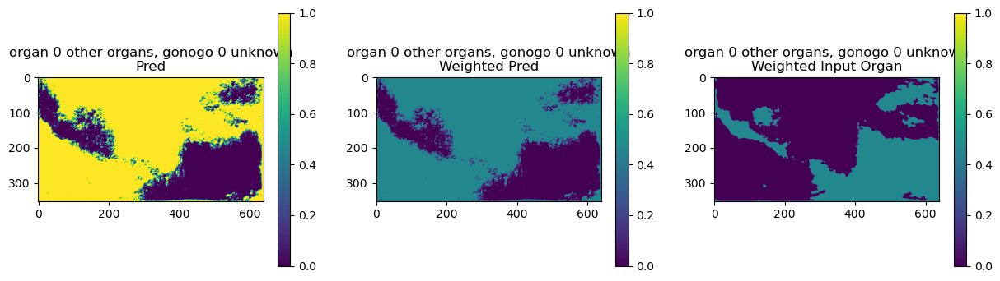

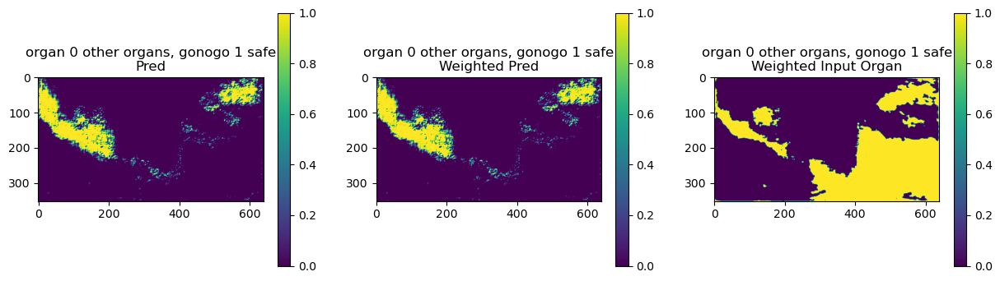

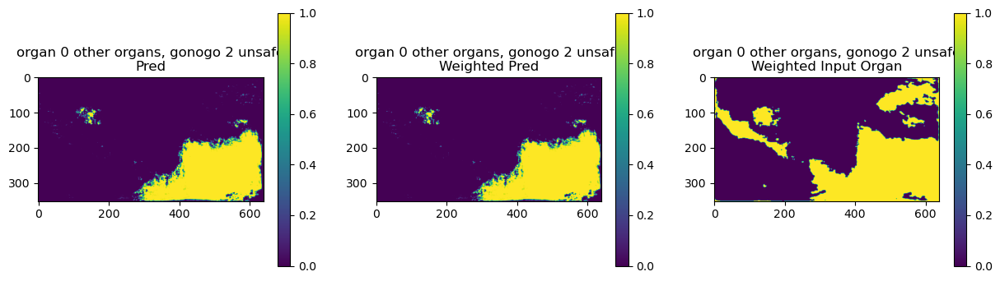

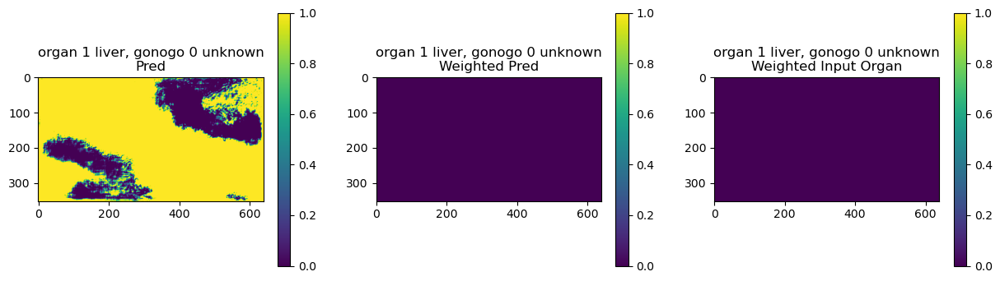

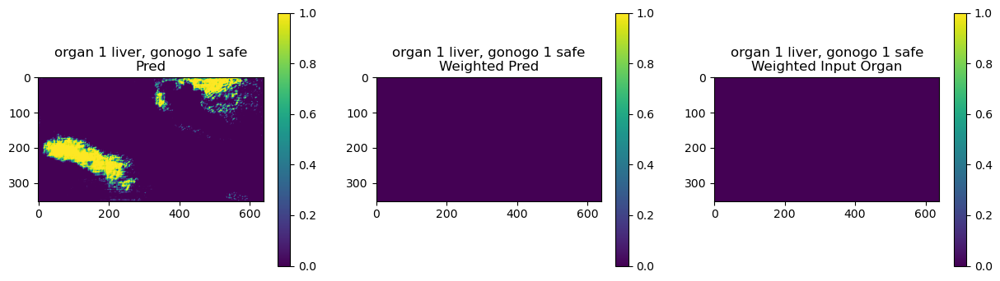

...

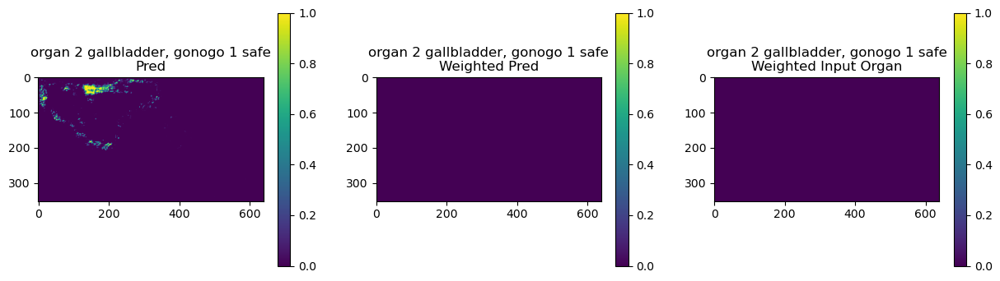

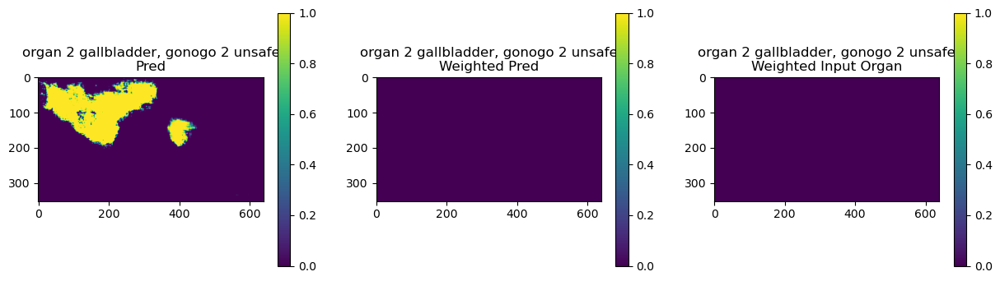

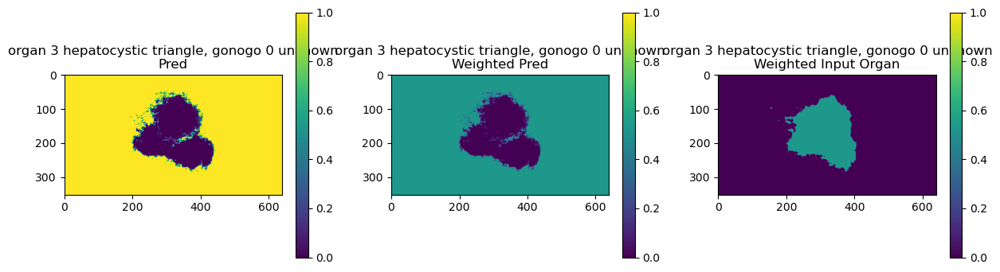

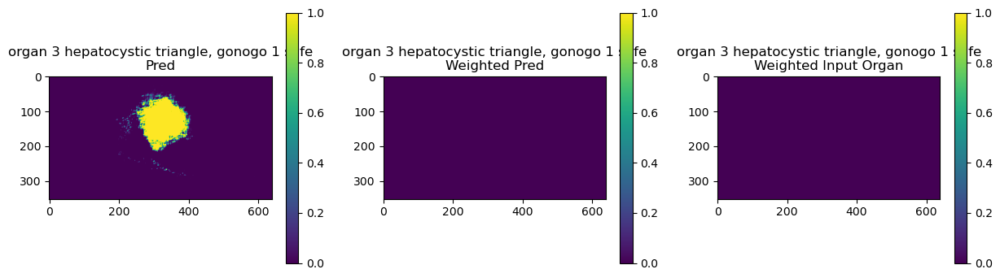

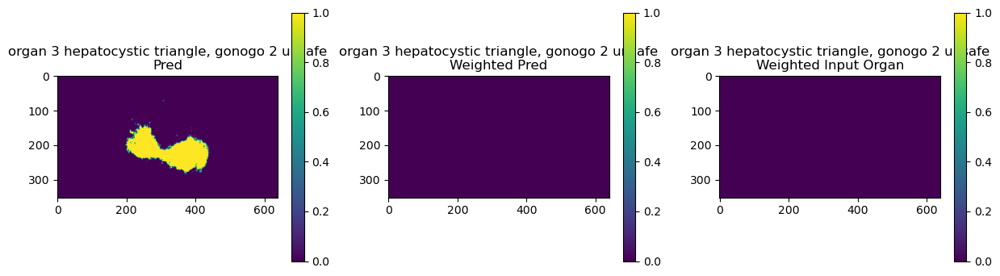

In [9]:
show_mask_weights(200)

## Playground

In [9]:
inputs_test = test_dataset[100]
image_test, organ_label_test, gonogo_label_test = inputs_test

with torch.no_grad():
    outputs = model(image_test.unsqueeze(0), return_dict=True)

In [10]:
organ_output = outputs['organ_output']
gonogo_output = outputs['gonogo_output']
organ_mask_output = organ_output.logits.argmax(dim=1).byte()
organ_mask_output.shape
gonogo_mask_output = gonogo_output.logits.argmax(dim=1).byte()
gonogo_mask_output.shape

torch.Size([1, 352, 640])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


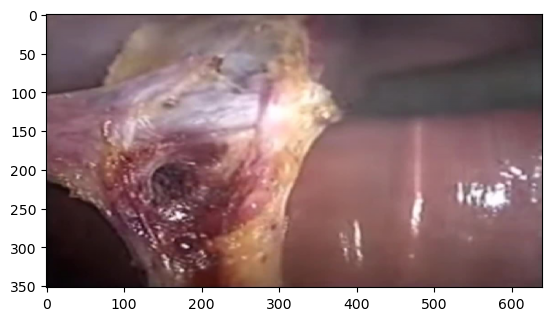

In [11]:
plt.imshow(image_test.permute(1,2,0).cpu().numpy())

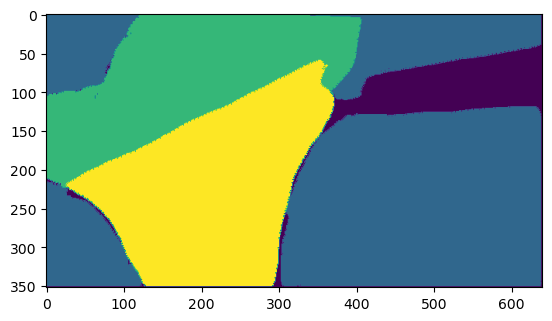

In [12]:
plt.imshow(organ_label_test.permute(1,2,0).cpu().numpy())

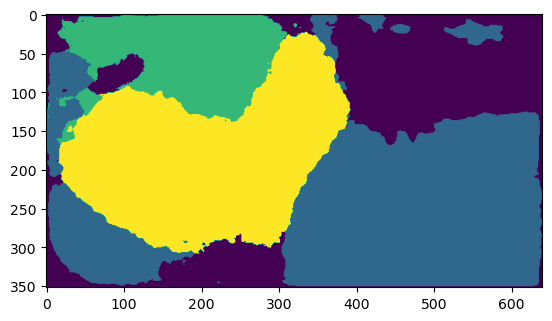

In [13]:
plt.imshow(organ_mask_output.permute(1,2,0).cpu().numpy())

In [14]:
(organ_mask_output == 3).sum()

tensor(61590)

In [15]:
gonogo_output.logits_all.shape, gonogo_output.mask_weights.shape, gonogo_output.masks.shape

(torch.Size([1, 4, 3, 352, 640]),
 torch.Size([1, 4, 3]),
 torch.Size([1, 4, 352, 640]))

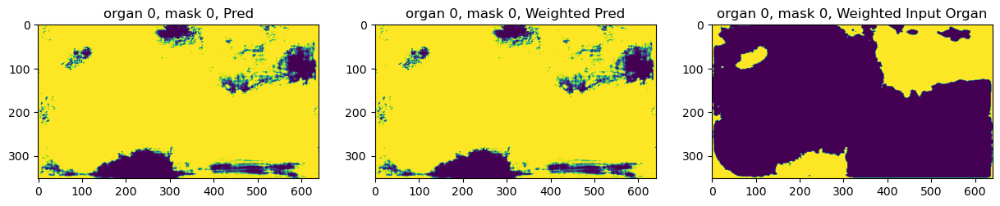

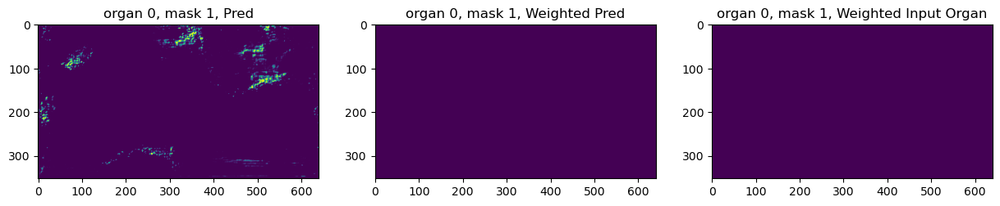

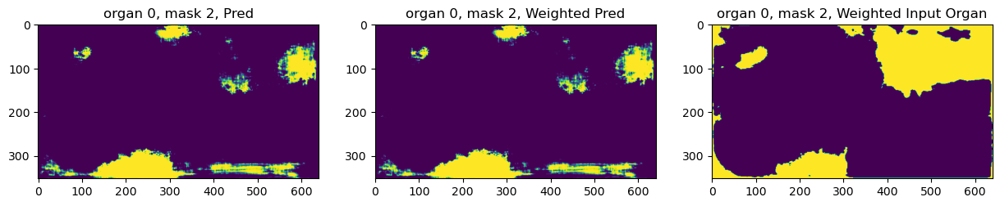

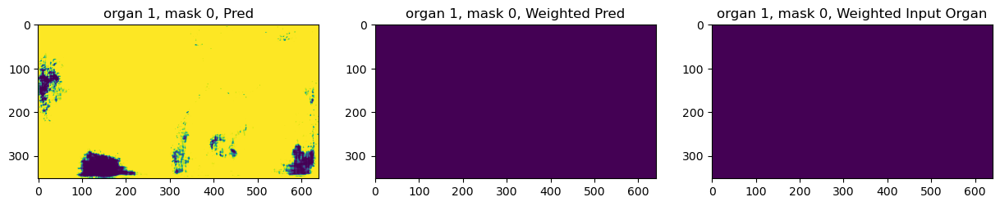

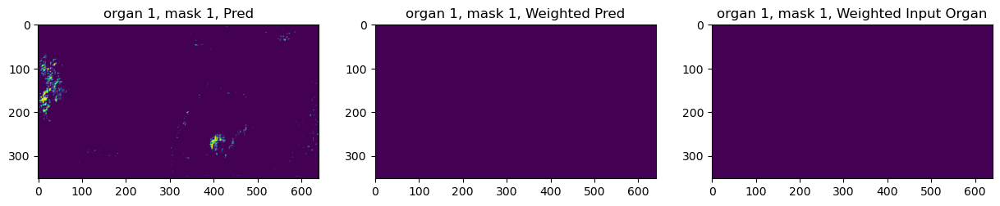

...

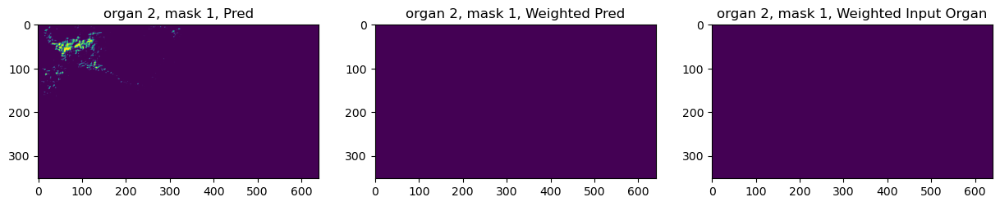

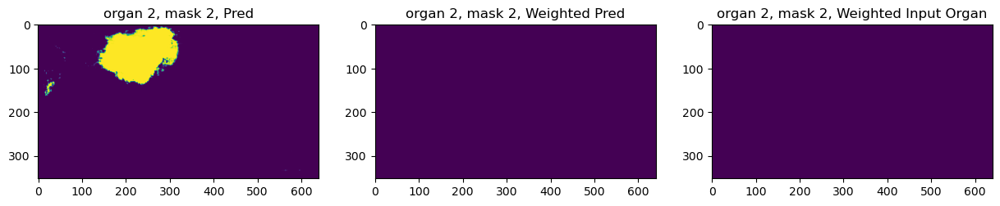

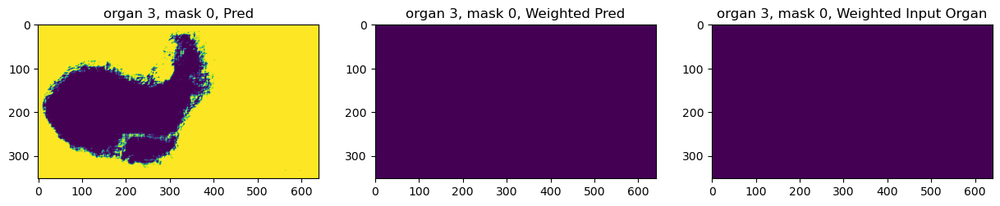

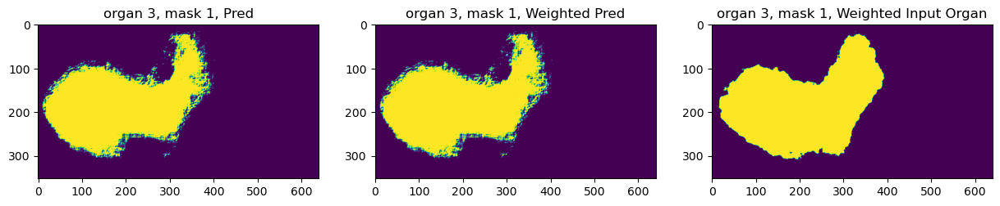

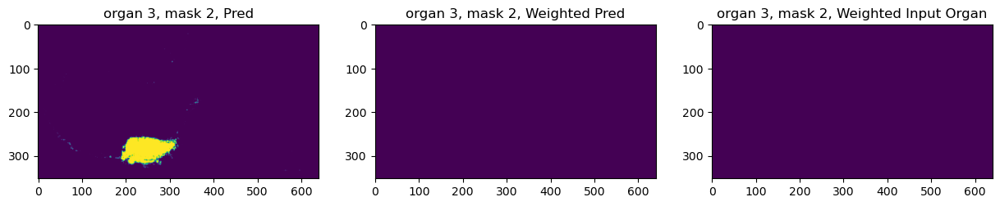

In [16]:
for i in range(4):
    for j in range(3):
        fig, axes = plt.subplots(1, 3, figsize=(5*3, 4))
        axes[0].imshow(gonogo_output.logits_all[0][i][j], vmin=0, vmax=1)
        axes[0].set_title(f'organ {i}, mask {j}, Pred')
        axes[1].imshow((gonogo_output.logits_all * gonogo_output.mask_weights.unsqueeze(-1).unsqueeze(-1))[0][i][j], vmin=0, vmax=1)
        axes[1].set_title(f'organ {i}, mask {j}, Weighted Pred')
        axes[2].imshow((gonogo_output.masks.unsqueeze(2) * gonogo_output.mask_weights.unsqueeze(-1).unsqueeze(-1))[0][i][j], vmin=0, vmax=1)
        axes[2].set_title(f'organ {i}, mask {j}, Weighted Input Organ')
        plt.show()

In [17]:
i = 0
j = 1
gonogo_output.logits_all[0][i][j], gonogo_output.logits_all[0][i][j].min(), gonogo_output.logits_all[0][i][j].max()

(tensor([[1.6586e-06, 1.7263e-07, 7.4571e-08,  ..., 1.6429e-09, 2.0314e-08,
          2.1665e-06],
         [4.1594e-06, 4.7294e-07, 1.0415e-07,  ..., 2.7599e-09, 5.1753e-07,
          1.0039e-04],
         [5.7445e-07, 4.7617e-07, 2.5994e-07,  ..., 4.9377e-10, 3.3181e-08,
          1.2086e-06],
         ...,
         [2.2116e-07, 3.3015e-06, 7.0352e-09,  ..., 1.2794e-03, 9.8183e-03,
          1.2011e-03],
         [4.5274e-11, 4.3307e-12, 1.9147e-12,  ..., 2.9291e-10, 6.0729e-09,
          2.9674e-06],
         [2.1305e-05, 1.4911e-04, 8.1975e-05,  ..., 7.1722e-05, 5.4018e-03,
          4.5113e-04]]),
 tensor(1.5586e-33),
 tensor(1.0000))

In [18]:
gonogo_output.logits_all[0][0][1][90][80], gonogo_output.logits_all[0][3][1][90][80]

(tensor(0.3428), tensor(3.3182e-13))

In [19]:
gonogo_output.logits_all[0][0][2][90][80], gonogo_output.logits_all[0][3][2][90][80]

(tensor(0.0033), tensor(1.2207e-21))

In [20]:
gonogo_output.logits_all[0][0][0][90][80], gonogo_output.logits_all[0][3][0][90][80]

(tensor(0.6538), tensor(1.))

In [21]:
i = 3
j = 1
gonogo_output.logits_all[0][i][j], gonogo_output.logits_all[0][i][j].min(), gonogo_output.logits_all[0][i][j].max()

(tensor([[2.2869e-07, 1.2421e-07, 1.9232e-09,  ..., 1.5367e-08, 3.5802e-08,
          2.3575e-06],
         [3.8704e-09, 1.8379e-09, 3.1876e-12,  ..., 2.9344e-09, 1.3827e-07,
          8.9601e-06],
         [1.1547e-09, 3.4834e-10, 4.6471e-13,  ..., 2.7109e-11, 5.3628e-09,
          1.4725e-06],
         ...,
         [2.6991e-09, 1.1285e-07, 4.2250e-10,  ..., 6.1462e-12, 4.0470e-09,
          1.0687e-05],
         [8.1127e-12, 4.9569e-11, 1.2201e-12,  ..., 1.1052e-14, 6.0467e-11,
          6.9449e-06],
         [3.5782e-05, 1.6442e-03, 8.0151e-05,  ..., 1.7861e-06, 7.6961e-05,
          9.0002e-04]]),
 tensor(6.3132e-22),
 tensor(1.))

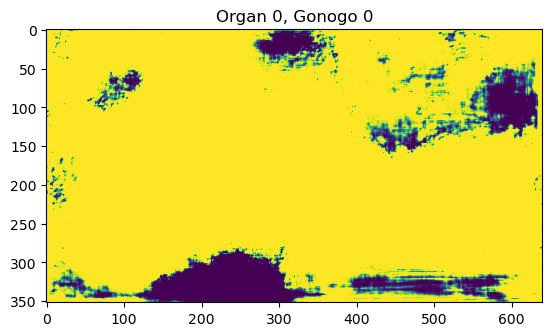

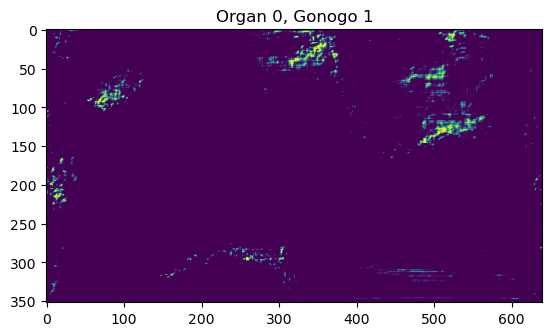

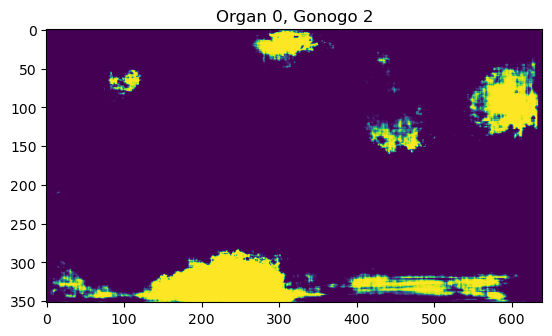

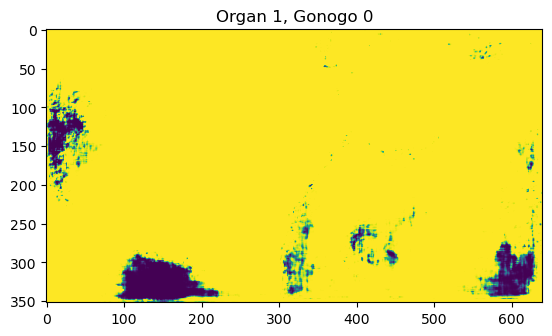

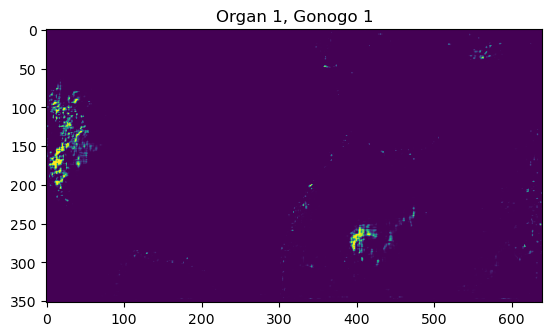

...

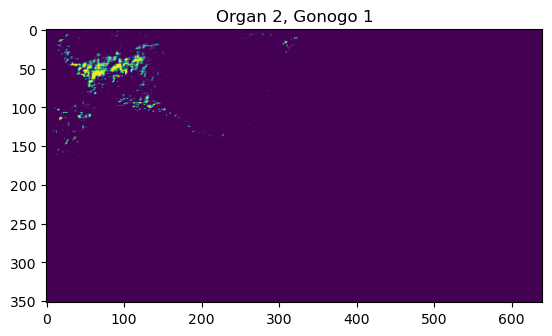

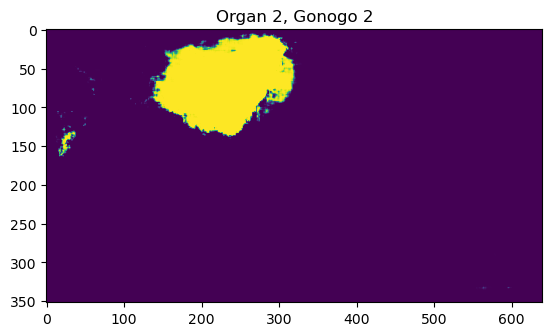

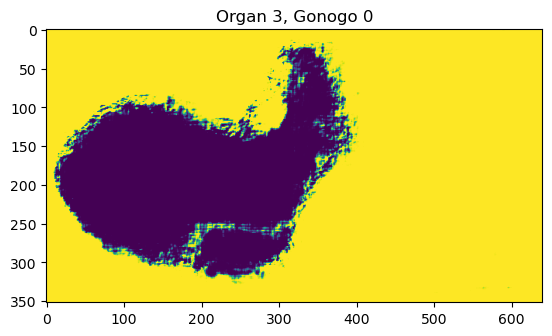

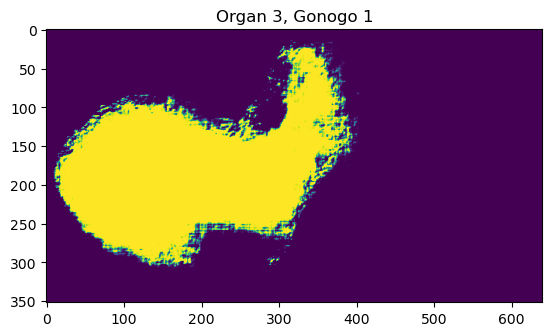

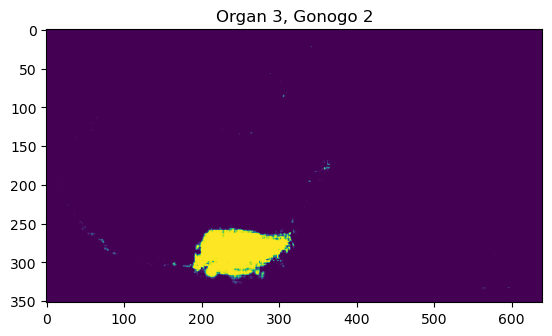

In [22]:
for i_og in range(4):
    for i_gng in range(3):
        plt.figure()
        plt.imshow(gonogo_output.logits_all[0,i_og,i_gng].cpu().numpy())
        plt.title(f'Organ {i_og}, Gonogo {i_gng}')
        plt.show()

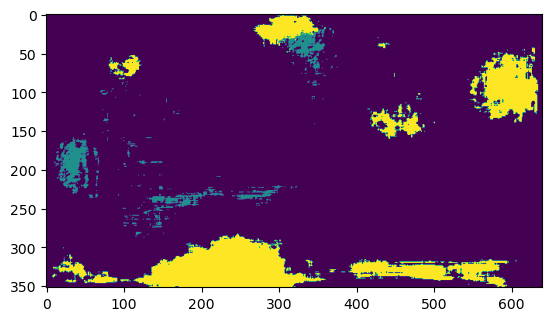

In [23]:
plt.imshow(gonogo_mask_output.permute(1,2,0).cpu().numpy())

In [24]:
gonogo_output.mask_weights, gonogo_output.mask_weights.shape

(tensor([[[1., 0., 1.],
          [0., 0., 0.],
          [0., 0., 0.],
          [0., 1., 0.]]]),
 torch.Size([1, 4, 3]))

In [25]:
gonogo_output.masks.shape

torch.Size([1, 4, 352, 640])

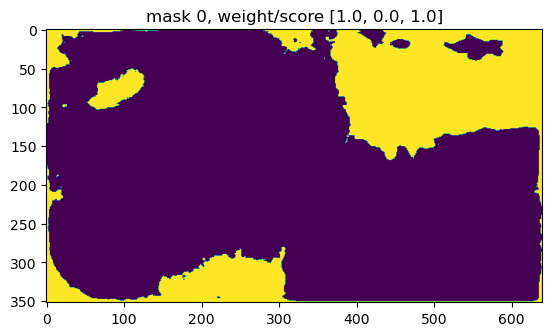

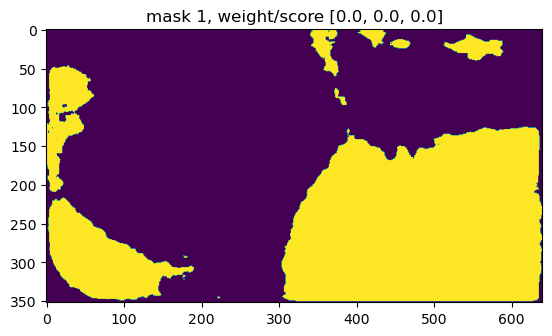

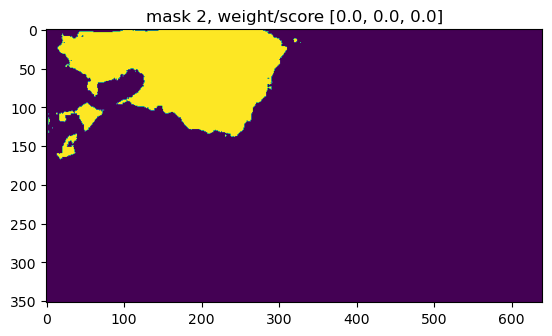

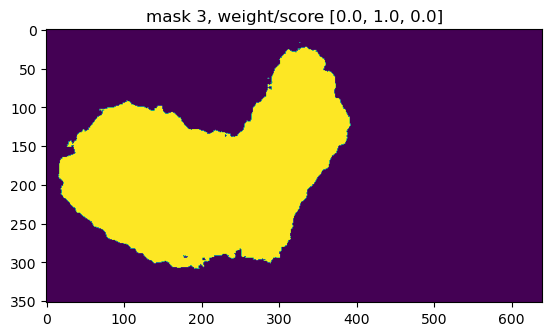

In [26]:
for i in range(len(gonogo_output.mask_weights[0])):
    plt.figure()
    plt.imshow(gonogo_output.masks[0][i].cpu().numpy())
    plt.title(f'mask {i}, weight/score {gonogo_output.mask_weights[0][i].detach().cpu().numpy().tolist()}')
    plt.show()

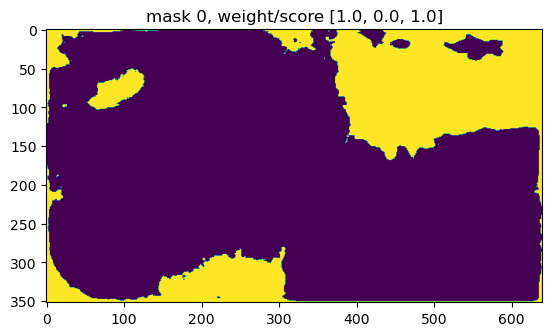

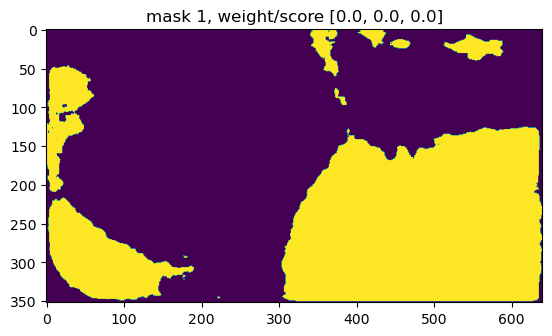

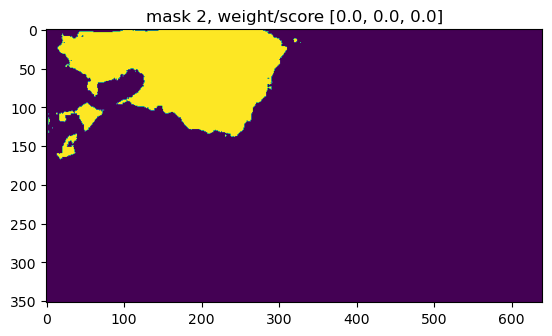

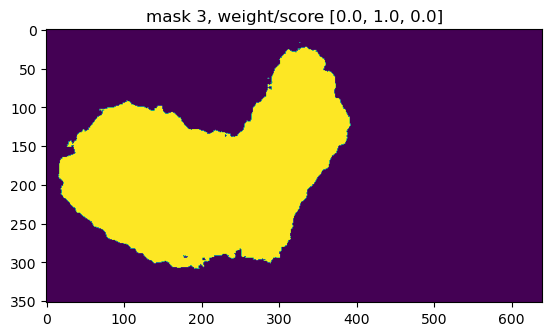

In [27]:
for i in range(len(gonogo_output.mask_weights[0])):
    plt.figure()
    plt.imshow((organ_mask_output == i).permute(1,2,0).cpu().numpy())
    plt.title(f'mask {i}, weight/score {gonogo_output.mask_weights[0][i].detach().cpu().numpy().tolist()}')
    plt.show()

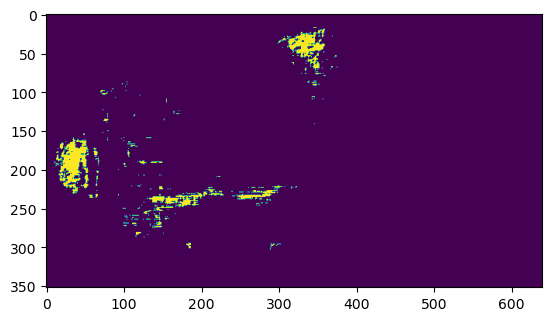

In [28]:
plt.imshow((gonogo_mask_output == 1).permute(1,2,0).cpu().numpy())

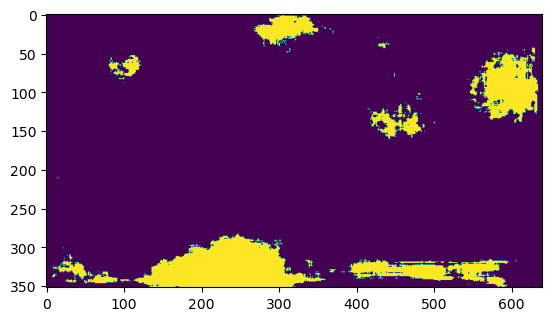

In [29]:
plt.imshow((gonogo_mask_output == 2).permute(1,2,0).cpu().numpy())

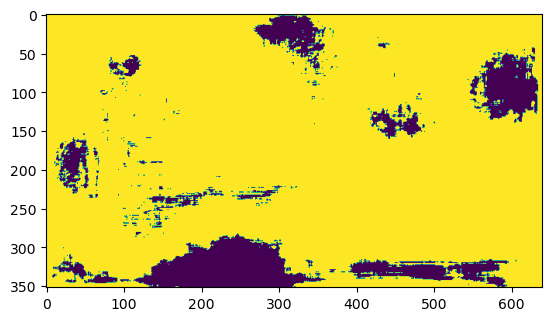

In [30]:
plt.imshow((gonogo_mask_output == 0).permute(1,2,0).cpu().numpy())